In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from pathlib import Path
import networkx as nx

import graph_delineator.delineate as gd

In [ ]:
# Define MERIT data directories
merit_dirs = {
    'basins': Path('/nas/cee-ice/data/MERIT'),
    'flow_dir': Path('/nas/cee-ice/data/MERIT-Hydro/processed/dir/'),
    'flow_acc': Path('/nas/cee-ice/data/MERIT-Hydro/processed/upg/')
}
gauges_csv = Path('/work/pi_casey_umass_edu/Owen/Reservoirs/graph_delineator/demo/demo.csv')
output_dir = Path('/work/pi_casey_umass_edu/Owen/Reservoirs/working_outputs')

In [ ]:
gd.delineate_basins(
    gauges_path = gauges_csv,
    merit_dirs = merit_dirs, 
    max_area = 500,
    consolidate = True,
    preserve_gauges = True,
    output_dir = output_dir,
    save_plots = True,
    overwrite = True
)


GRAPH-BASED WATERSHED DELINEATION
Data output directory: /work/pi_casey_umass_edu/Owen/Reservoirs/working_outputs


Basin 7: 100%|██████████| 1/1 [00:24<00:00, 24.52s/it]


DELINEATION SUMMARY
  Outlet USGS-01578310: 128 Gauges, 92 Catchment Nodes
COMPLETE


{'USGS-01578310': DelineationResult(graph=<networkx.classes.digraph.DiGraph object at 0x79e78e7bbfe0>, outlet_id='USGS-01578310')}

In [ ]:
# Read in the subbasin and gauge outputs from the delineation (geoparquet format)
subbasins = gpd.read_parquet('/work/pi_casey_umass_edu/Owen/Reservoirs/graph_delineator/demo/demo/subbasins/USGS-01578310_subbasins.parquet')
subbasins

,id,geometry,area_km2,uparea_km2,node_type,is_gauge,nextdown
0,73005596,"POLYGON ((-78.57458 40.30458, -78.57458 40.307...",299.908022,299.908022,original,False,USGS-01556000
1,73005555,"POLYGON ((-77.56042 40.92042, -77.56042 40.921...",244.252083,244.252083,original,False,73005401
2,73005544,"POLYGON ((-78.40625 40.81292, -78.40625 40.814...",422.608973,422.608973,original,False,USGS-01542500
3,73002036,"MULTIPOLYGON (((-75.10208 42.80542, -75.10208 ...",269.171027,269.171027,original,False,73001995
4,73003655,"POLYGON ((-77.89708 41.71208, -77.89625 41.712...",481.161533,481.161533,original,False,73003544
...,...,...,...,...,...,...,...
215,USGS-01574500,"POLYGON ((-76.98458 39.80792, -76.98458 39.808...",194.767032,194.767032,gauge,True,USGS-01575500
216,USGS-01572025,"POLYGON ((-76.50208 40.62792, -76.50208 40.629...",299.444031,299.444031,gauge,True,USGS-01572190
217,USGS-01546400,"POLYGON ((-77.90208 40.75542, -77.90208 40.756...",150.114919,150.114919,gauge,True,USGS-01546500
218,USGS-01557500,"POLYGON ((-78.29375 40.74375, -78.29292 40.743...",115.606835,115.606835,gauge,True,USGS-01558000


In [ ]:
gauges = gpd.read_parquet('/work/pi_casey_umass_edu/Owen/Reservoirs/graph_delineator/demo/gauges/USGS-01578310_gauges.parquet')
gauges

,id,geometry,lat,lng,area_km2,uparea_km2
0,USGS-01509000,POINT (-76.15939 42.60267),42.602667,-76.159389,264.627563,757.690269
1,USGS-01505000,POINT (-75.51056 42.67861),42.678611,-75.510556,216.447805,679.254638
2,USGS-01510000,POINT (-75.89972 42.54111),42.541111,-75.899722,376.972399,376.972399
3,USGS-01553025,POINT (-76.89 41.10806),41.108056,-76.890000,464.086764,16835.762470
4,USGS-01551500,POINT (-76.99661 41.23612),41.236116,-76.996608,267.546241,14681.365358
...,...,...,...,...,...,...
123,USGS-01574500,POINT (-76.85331 39.87871),39.878710,-76.853307,194.767032,194.767032
124,USGS-01572025,POINT (-76.40218 40.53259),40.532590,-76.402179,299.444031,299.444031
125,USGS-01546400,POINT (-77.8275 40.83367),40.833673,-77.827501,150.114919,150.114919
126,USGS-01557500,POINT (-78.23362 40.68367),40.683673,-78.233624,115.606835,115.606835


<Axes: >

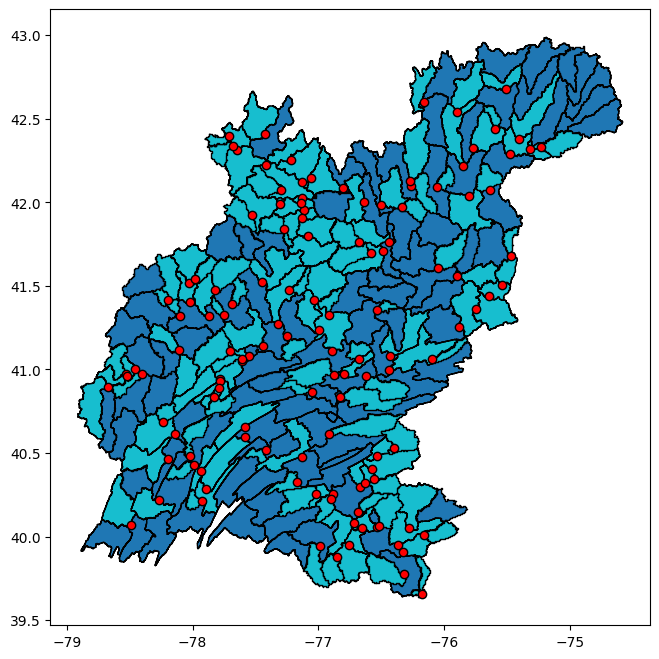

In [ ]:
fix, ax = plt.subplots(figsize=(8,8))

subbasins.plot('is_gauge', edgecolor="black", ax=ax)
gauges.plot(color='red', edgecolor="black", ax=ax)

/tmp/ipykernel_3034810/3511039734.py:17: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


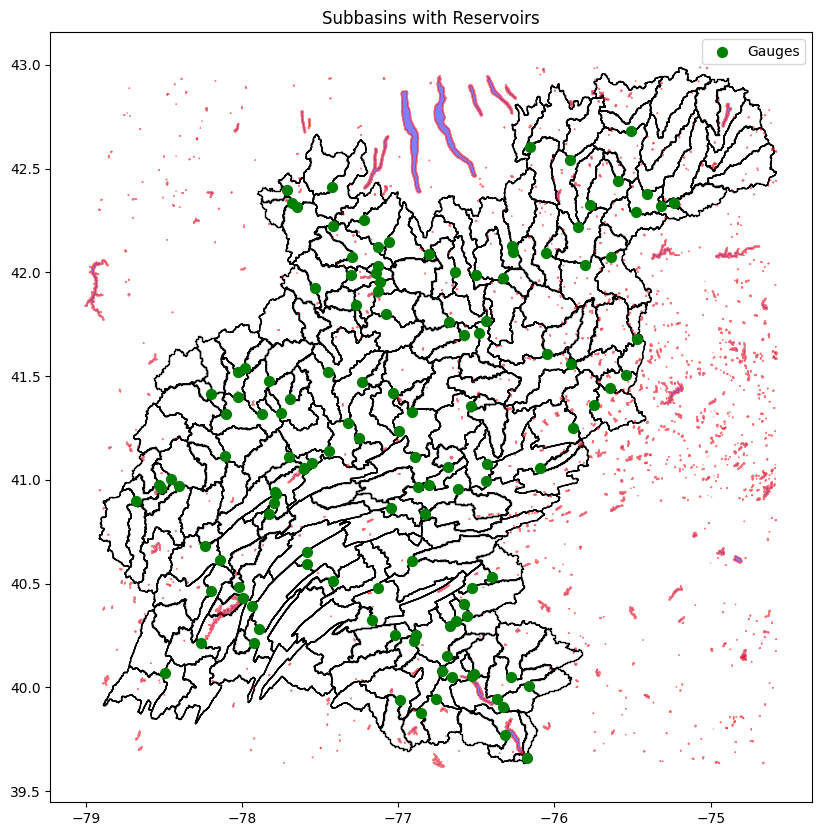

In [ ]:
# Load global reservoirs GDB, clipping to subbasin extent
gdb_path = r'/work/pi_casey_umass_edu/Owen/Reservoirs/LakeSPvC_ts_for_Ted/SWOT_PLD_v106_reservoirs.gdb'

# Get bounding box of subbasins for efficient reading
bbox = tuple(subbasins.total_bounds)

# Read reservoirs using bbox filter
reservoirs = gpd.read_file(gdb_path, bbox=bbox)

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
subbasins.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Subbasins')
reservoirs.plot(ax=ax, facecolor='blue', edgecolor='red', alpha=0.5, label='Reservoirs')
gauges.plot(ax=ax, color='green', markersize=50, label='Gauges')

plt.title('Subbasins with Reservoirs')
plt.legend()
plt.show()

In [ ]:
# 1. Define the river path (using your logic)
riv_file = merit_dirs['basins'] / f"riv_pfaf_7_MERIT_Hydro_v07_Basins_v01_bugfix1.shp"

# 2. Load and Project Rivers
riv = gpd.read_file(riv_file, bbox=tuple(subbasins.total_bounds), engine='pyogrio')

In [ ]:
gauges.head()

,id,geometry,lat,lng,area_km2,uparea_km2
0,USGS-01509000,POINT (-76.15939 42.60267),42.602667,-76.159389,264.627563,757.690269
1,USGS-01505000,POINT (-75.51056 42.67861),42.678611,-75.510556,216.447805,679.254638
2,USGS-01510000,POINT (-75.89972 42.54111),42.541111,-75.899722,376.972399,376.972399
3,USGS-01553025,POINT (-76.89 41.10806),41.108056,-76.890000,464.086764,16835.762470
4,USGS-01551500,POINT (-76.99661 41.23612),41.236116,-76.996608,267.546241,14681.365358


In [ ]:
import geopandas as gpd

# 1. Coordinate alignment
subbasins_web = subbasins.to_crs(epsg=4326)
gauges_web = gauges.to_crs(epsg=4326)
riv_web = riv.to_crs(epsg=4326)

# 2. Base Layer: Subbasins with 'CartoDB Positron' tiles
m = subbasins_web.explore(
    column='node_type', 
    cmap='Set3', 
    tiles="CartoDB positron",  # This is the simple/clean basemap
    style_kwds=dict(color="white", weight=1.5, fillOpacity=0.6),
    name="Subbasins",
    legend=True,
    tooltip=['node_type']
)

riv_web.explore(
    m=m, 
    color="blue", 
    style_kwds=dict(weight=1.2, opacity=0.7), 
    name="Rivers (MERIT Hydro)"
)

# 4. Top Layer: Nodes
gauges_web.explore(
    m=m,  
    cmap='Wistia', 
    marker_type='circle_marker',
    marker_kwds=dict(radius=6, fill=True), 
    style_kwds=dict(color="black", weight=1, fillOpacity=1)
)

m